# Audio Classification Using Deep learning
## Using Multi layer Perceptron(MLP) and than applying CNN

In [2]:
# Load imports

import IPython.display as ipd
import librosa
import librosa.display
import matplotlib.pyplot as plt
import pandas as pd
import os

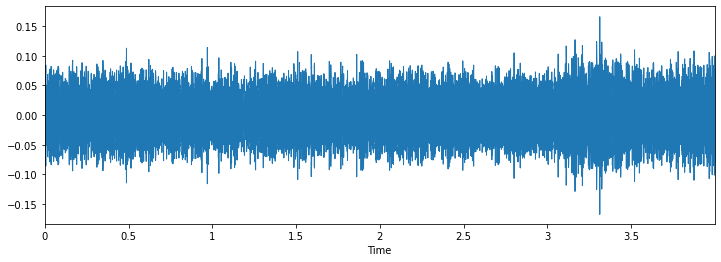

In [3]:
# Class: siren

filename = '../dataset/UrbanSound8K/audio/fold7/102853-8-0-6.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

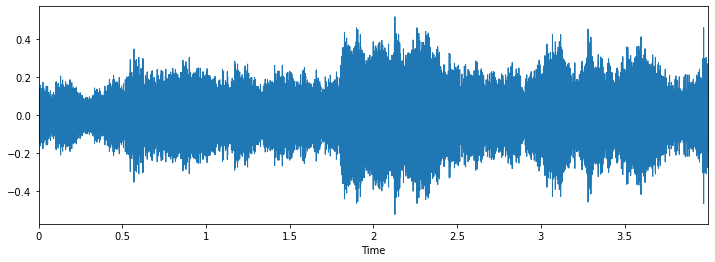

In [4]:
# Class: Street Music

filename = '../dataset/UrbanSound8K/audio/fold1/24074-1-0-7.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

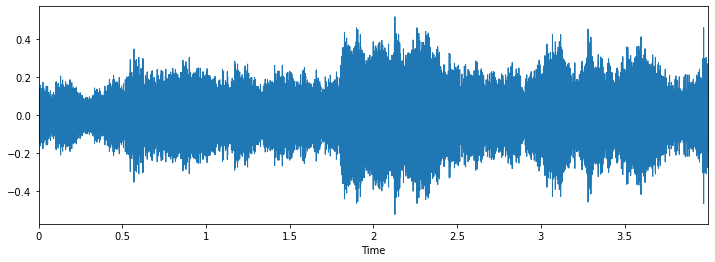

In [5]:
# Class: Drilling

filename = '../dataset/UrbanSound8K/audio/fold1/24074-1-0-7.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

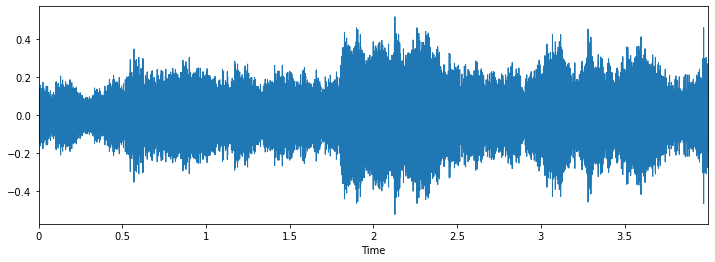

In [6]:
# Class: dog bark

filename = '../dataset/UrbanSound8K/audio/fold1/24074-1-0-7.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

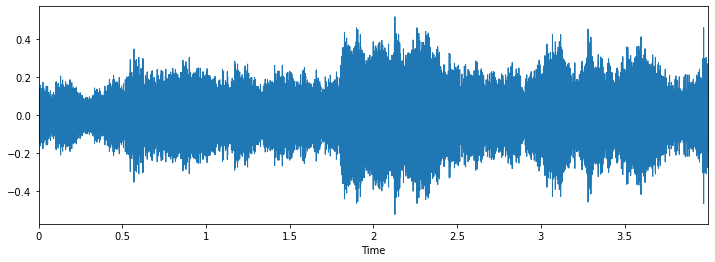

In [7]:
# Class: Children Playing

filename = '../dataset/UrbanSound8K/audio/fold1/24074-1-0-7.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

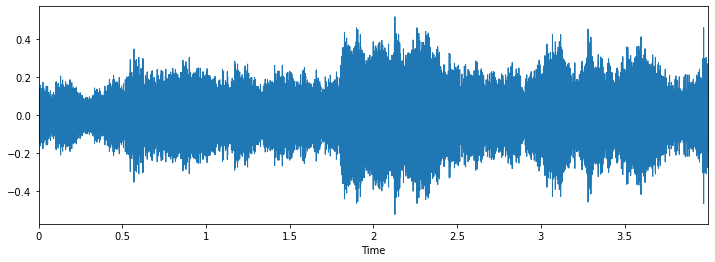

In [8]:
# Class: Gun Shot

filename = '../dataset/UrbanSound8K/audio/fold1/24074-1-0-7.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

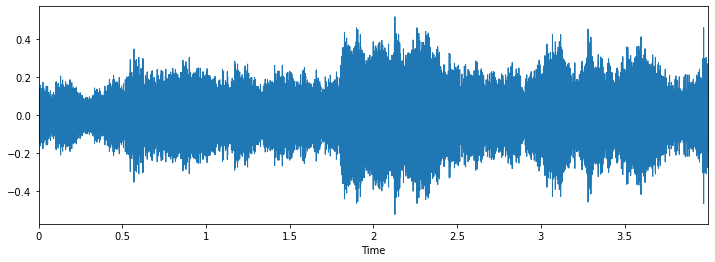

In [9]:
# Class: Engine Idling

filename = '../dataset/UrbanSound8K/audio/fold1/24074-1-0-7.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

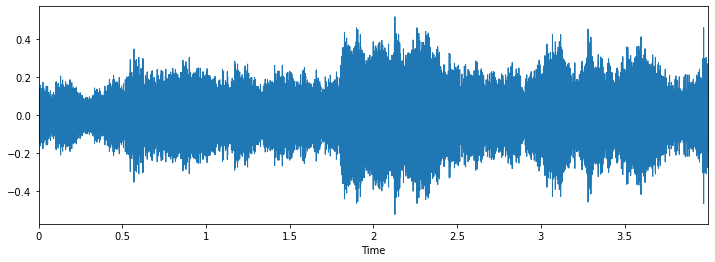

In [10]:
# Class: Air Conditioner

filename = '../dataset/UrbanSound8K/audio/fold1/24074-1-0-7.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

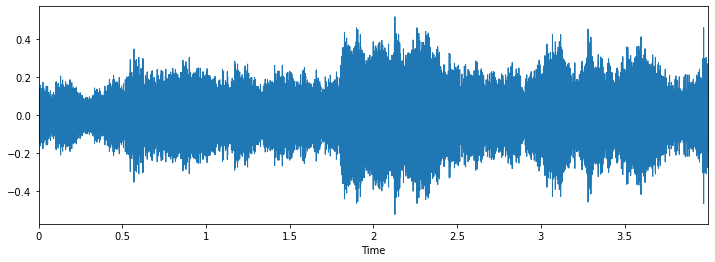

In [11]:
# Class: Jackhammer

filename = '../dataset/UrbanSound8K/audio/fold1/24074-1-0-7.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

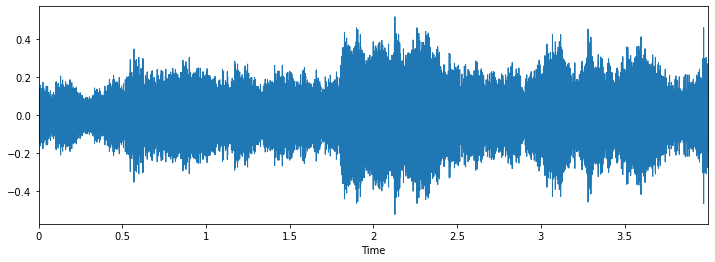

In [12]:
# Class: Car Horn

filename = '../dataset/UrbanSound8K/audio/fold1/24074-1-0-7.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

## This is how dataset looks

In [13]:
import pandas as pd
metadata = pd.read_csv('../dataset/UrbanSound8K/metadata/UrbanSound8K.csv')
metadata.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class_name
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing


### Class distributions

In [14]:
print(metadata.class_name.value_counts())

air_conditioner     1000
drilling            1000
street_music        1000
engine_idling       1000
dog_bark            1000
children_playing    1000
jackhammer          1000
siren                929
car_horn             429
gun_shot             374
Name: class_name, dtype: int64


### Audio sample file properties

Next we will iterate through each of the audio sample files and extract, number of audio channels, sample rate and bit-depth. 

In [16]:
# Load various imports 
import pandas as pd
import os
import librosa
import librosa.display

from helpers.wavfilehelper import WavFileHelper
wavfilehelper = WavFileHelper()

audiodata = []
for index, row in metadata.iterrows():
    
    file_name = os.path.join(os.path.abspath('../dataset/UrbanSound8K/audio/'),'fold'+str(row["fold"])+'/',str(row["slice_file_name"]))
    data = wavfilehelper.read_file_properties(file_name)
    audiodata.append(data)

# Convert into a Panda dataframe
audiodf = pd.DataFrame(audiodata, columns=['num_channels','sample_rate','bit_depth'])

### To convert mono audio to stereo audio

In [17]:
# num of channels 

print(audiodf.num_channels.value_counts(normalize=True))

2    0.915369
1    0.084631
Name: num_channels, dtype: float64


In [18]:
# sample rates 

print(audiodf.sample_rate.value_counts(normalize=True))

44100     0.614979
48000     0.286532
96000     0.069858
24000     0.009391
16000     0.005153
22050     0.005039
11025     0.004466
192000    0.001947
8000      0.001374
11024     0.000802
32000     0.000458
Name: sample_rate, dtype: float64


In [19]:
# bit depth

print(audiodf.bit_depth.value_counts(normalize=True))

16    0.659414
24    0.315277
32    0.019354
8     0.004924
4     0.001031
Name: bit_depth, dtype: float64


### Data PreProcessing and Data Splitting

In [21]:
from scipy.io import wavfile as wav
import numpy as np

filename = '../dataset/UrbanSound8K/audio/fold1/24074-1-0-7.wav' 

librosa_audio, librosa_sample_rate = librosa.load(filename) 
scipy_sample_rate, scipy_audio = wav.read(filename) 

print('Original sample rate:', scipy_sample_rate) 
print('Librosa sample rate:', librosa_sample_rate) 

Original sample rate: 44100
Librosa sample rate: 22050


Here librosa convert audio to 22.05 KHz Sample

In [22]:
print('Original audio file min~max range:', np.min(scipy_audio), 'to', np.max(scipy_audio))
print('Librosa audio file min~max range:', np.min(librosa_audio), 'to', np.max(librosa_audio))

Original audio file min~max range: -25791 to 31844
Librosa audio file min~max range: -0.46381214 to 0.52137864


### Bit Depth

This is to remove the complication because librosa function load audio in values range between -1 and 1. 
This is Normalization 

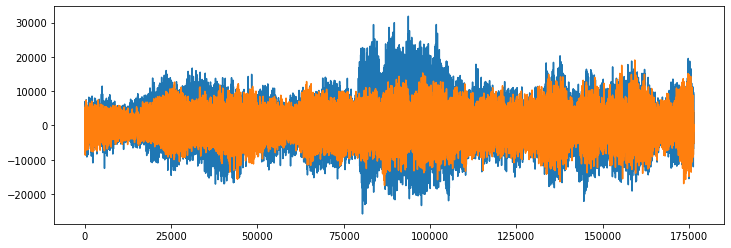

In [23]:
import matplotlib.pyplot as plt

# Original audio with 2 channels 
plt.figure(figsize=(12, 4))
plt.plot(scipy_audio)

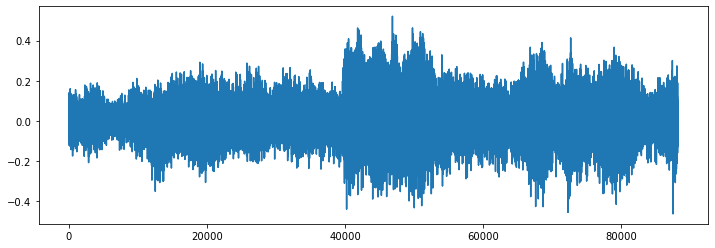

In [24]:
# Librosa audio with channels merged 
plt.figure(figsize=(12, 4))
plt.plot(librosa_audio)

Librosa's mfcc() function which generates an MFCC from time series audio data.

In [25]:
mfccs = librosa.feature.mfcc(y=librosa_audio, sr=librosa_sample_rate, n_mfcc=40)
print(mfccs.shape)

(40, 173)


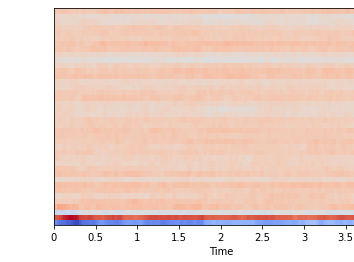

In [26]:
import librosa.display
librosa.display.specshow(mfccs, sr=librosa_sample_rate, x_axis='time')

#### Extracting MFCC's for every file 

We will now extract an MFCC for each audio file in the dataset and store it in a Panda Dataframe along with it's classification label. 

In [27]:
def extract_features(file_name):
   
    try:
        audio, sample_rate = librosa.load(file_name, res_type='kaiser_fast') 
        mfccs = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40)
        mfccsscaled = np.mean(mfccs.T,axis=0)
        
    except Exception as e:
        print("Error encountered while parsing file: ", file)
        return None 
     
    return mfccsscaled

In [28]:
# Load various imports 
import os

# Set the path to the full dataset 
fulldatasetpath = '../dataset/UrbanSound8K/audio/'

metadata = pd.read_csv('../dataset/UrbanSound8K/metadata/UrbanSound8K.csv')

features = []

# Iterate through each sound file and extract the features 
for index, row in metadata.iterrows():
    
    file_name = os.path.join(os.path.abspath(fulldatasetpath),'fold'+str(row["fold"])+'/',str(row["slice_file_name"]))
    
    class_label = row["class_name"]
    data = extract_features(file_name)
    
    features.append([data, class_label])

# Convert into a Panda dataframe 
featuresdf = pd.DataFrame(features, columns=['feature','class_label'])

print('Finished feature extraction from ', len(featuresdf), ' files') 

Finished feature extraction from  8732  files


### Convert the data and labels

We will use `sklearn.preprocessing.LabelEncoder` to encode the categorical text data into model-understandable numerical data. 

In [35]:
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical

# Convert features and corresponding classification labels into numpy arrays
X = np.array(featuresdf.feature.tolist())
y = np.array(featuresdf.class_label.tolist())

# Encode the classification labels
le = LabelEncoder()
yy = to_categorical(le.fit_transform(y)) 

In [36]:
# split the dataset 
from sklearn.model_selection import train_test_split 

x_train, x_test, y_train, y_test = train_test_split(X, yy, test_size=0.2, random_state = 42)

In [37]:
### store the preprocessed data for use in the next notebook

%store x_train 
%store x_test 
%store y_train 
%store y_test 
%store yy 
%store le

Stored 'x_train' (ndarray)
Stored 'x_test' (ndarray)
Stored 'y_train' (ndarray)
Stored 'y_test' (ndarray)
Stored 'yy' (ndarray)
Stored 'le' (LabelEncoder)


In [38]:
import numpy as np
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Convolution2D, MaxPooling2D
from keras.optimizers import Adam
from keras.utils import np_utils
from sklearn import metrics 

num_labels = yy.shape[1]
filter_size = 2

# Construct model 
model = Sequential()

model.add(Dense(256, input_shape=(40,)))
model.add(Activation('relu'))
model.add(Dropout(0.5))

model.add(Dense(256))
model.add(Activation('relu'))
model.add(Dropout(0.5))

model.add(Dense(num_labels))
model.add(Activation('softmax'))

In [39]:
# Compile the model
model.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer='adam') 

In [40]:
# Display model architecture summary 
model.summary()

# Calculate pre-training accuracy 
score = model.evaluate(x_test, y_test, verbose=0)
accuracy = 100*score[1]

print("Pre-training accuracy: %.4f%%" % accuracy)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 256)               10496     
_________________________________________________________________
activation (Activation)      (None, 256)               0         
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               65792     
_________________________________________________________________
activation_1 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 10)                2

In [41]:
from keras.callbacks import ModelCheckpoint 
from datetime import datetime 

num_epochs = 100
num_batch_size = 32

checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.basic_mlp.hdf5', 
                               verbose=1, save_best_only=True)
start = datetime.now()

model.fit(x_train, y_train, batch_size=num_batch_size, epochs=num_epochs, validation_data=(x_test, y_test), callbacks=[checkpointer], verbose=1)


duration = datetime.now() - start
print("Training completed in time: ", duration)

saved_models\weights.best.basic_mlp.hdf5
219/219 [==============================] - 1s 4ms/step - loss: 0.7343 - accuracy: 0.7460 - val_loss: 0.5660 - val_accuracy: 0.8231
Epoch 35/100
212/219 [============================>.] - ETA: 0s - loss: 0.7193 - accuracy: 0.7544
Epoch 00035: val_loss improved from 0.56597 to 0.55722, saving model to saved_models\weights.best.basic_mlp.hdf5
219/219 [==============================] - 1s 4ms/step - loss: 0.7210 - accuracy: 0.7546 - val_loss: 0.5572 - val_accuracy: 0.8243
Epoch 36/100
204/219 [==========================>...] - ETA: 0s - loss: 0.7112 - accuracy: 0.7537
Epoch 00036: val_loss improved from 0.55722 to 0.55302, saving model to saved_models\weights.best.basic_mlp.hdf5
219/219 [==============================] - 1s 4ms/step - loss: 0.7128 - accuracy: 0.7529 - val_loss: 0.5530 - val_accuracy: 0.8283
Epoch 37/100
215/219 [============================>.] - ETA: 0s - loss: 0.7029 - accuracy: 0.7654
Epoch 00037: val_loss improved from 0.55302 to

In [42]:
# Evaluating the model on the training and testing set
score = model.evaluate(x_train, y_train, verbose=0)
print("Training Accuracy: ", score[1])

score = model.evaluate(x_test, y_test, verbose=0)
print("Testing Accuracy: ", score[1])

Training Accuracy:  0.9398711323738098
Testing Accuracy:  0.879221498966217


In [43]:

def extract_feature(file_name):
   
    try:
        audio_data, sample_rate = librosa.load(file_name, res_type='kaiser_fast') 
        mfccs = librosa.feature.mfcc(y=audio_data, sr=sample_rate, n_mfcc=40)
        mfccsscaled = np.mean(mfccs.T,axis=0)
        
    except Exception as e:
        print("Error encountered while parsing file: ", file)
        return None, None

    return np.array([mfccsscaled])

In [44]:
def print_prediction(file_name):
    prediction_feature = extract_feature(file_name) 

    predicted_vector = model.predict_classes(prediction_feature)
    predicted_class = le.inverse_transform(predicted_vector) 
    print("The predicted class is:", predicted_class[0], '\n') 

    predicted_proba_vector = model.predict_proba(prediction_feature) 
    predicted_proba = predicted_proba_vector[0]
    for i in range(len(predicted_proba)): 
        category = le.inverse_transform(np.array([i]))
        print(category[0], "\t\t : ", format(predicted_proba[i], '.32f') )

In [45]:
# Class: Street Music

filename = '../dataset/UrbanSound8K/audio/fold1/24074-1-0-7.wav' 
print_prediction(filename) 

Instructions for updating:
Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
The predicted class is: car_horn 

Instructions for updating:
Please use `model.predict()` instead.
air_conditioner 		 :  0.00000000000000000000000000000000
car_horn 		 :  1.00000000000000000000000000000000
children_playing 		 :  0.00000000000000000000000000000000
dog_bark 		 :  0.00000000000000000000000000000000
drilling 		 :  0.00000000000000000000000000000000
engine_idling 		 :  0.00000000000000000000000000000765
gun_shot 		 :  0.00000000000000000000000000000000
jackhammer 		 :  0.00000000000000000000000000000000
siren 		 :  0.00000000000000000000000000000000
street_music 		 :  0.00000000000000000000000000001030


## Here we use Test data to test our model

In [47]:
filename = '../dataset/UrbanSound8K/audio/fold1/7383-3-0-0.wav'
print_prediction(filename) 

The predicted class is: dog_bark 

air_conditioner 		 :  0.00000000004686284693633524511824
car_horn 		 :  0.00000000739600469756851452984847
children_playing 		 :  0.00000029838477644261729437857866
dog_bark 		 :  0.99980014562606811523437500000000
drilling 		 :  0.00000047446965822928177658468485
engine_idling 		 :  0.00000000028909674654187256237492
gun_shot 		 :  0.00001990623059100471436977386475
jackhammer 		 :  0.00000000000000015292477090027968
siren 		 :  0.00007651220221305266022682189941
street_music 		 :  0.00010258187103318050503730773926


### Here we use CNN to improve accuracy

In [48]:
max_pad_len = 174

def extract_features(file_name):
   
    try:
        audio, sample_rate = librosa.load(file_name, res_type='kaiser_fast') 
        mfccs = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40)
        pad_width = max_pad_len - mfccs.shape[1]
        mfccs = np.pad(mfccs, pad_width=((0, 0), (0, pad_width)), mode='constant')
        
    except Exception as e:
        print("Error encountered while parsing file: ", file_name)
        return None 
     
    return mfccs

In [51]:
fulldatasetpath = '../dataset/UrbanSound8K/audio/'

metadata = pd.read_csv('../dataset/UrbanSound8K/metadata/UrbanSound8K.csv')

features = []

# Iterate through each sound file and extract the features 
for index, row in metadata.iterrows():
    
    file_name = os.path.join(os.path.abspath(fulldatasetpath),'fold'+str(row["fold"])+'/',str(row["slice_file_name"]))
    
    class_label = row["class_name"]
    data = extract_features(file_name)
    
    features.append([data, class_label])

# Convert into a Panda dataframe 
featuresdf = pd.DataFrame(features, columns=['feature','class_label'])

print('Finished feature extraction from ', len(featuresdf), ' files') 

Finished feature extraction from  8732  files


In [52]:
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical

# Convert features and corresponding classification labels into numpy arrays
X = np.array(featuresdf.feature.tolist())
y = np.array(featuresdf.class_label.tolist())

# Encode the classification labels
le = LabelEncoder()
yy = to_categorical(le.fit_transform(y)) 

# split the dataset 
from sklearn.model_selection import train_test_split 

x_train, x_test, y_train, y_test = train_test_split(X, yy, test_size=0.2, random_state = 42)

# CNN Arcitechture

In [53]:
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Convolution2D, Conv2D, MaxPooling2D, GlobalAveragePooling2D
from keras.optimizers import Adam
from keras.utils import np_utils
from sklearn import metrics 

num_rows = 40
num_columns = 174
num_channels = 1

x_train = x_train.reshape(x_train.shape[0], num_rows, num_columns, num_channels)
x_test = x_test.reshape(x_test.shape[0], num_rows, num_columns, num_channels)

num_labels = yy.shape[1]
filter_size = 2

# Construct model 
model = Sequential()
model.add(Conv2D(filters=16, kernel_size=2, input_shape=(num_rows, num_columns, num_channels), activation='relu'))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.2))

model.add(Conv2D(filters=32, kernel_size=2, activation='relu'))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.2))

model.add(Conv2D(filters=64, kernel_size=2, activation='relu'))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.2))

model.add(Conv2D(filters=128, kernel_size=2, activation='relu'))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.2))
model.add(GlobalAveragePooling2D())

model.add(Dense(num_labels, activation='softmax')) 

In [54]:
# Compile the model
model.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer='adam') 

In [55]:
# Display model architecture summary 
model.summary()

# Calculate pre-training accuracy 
score = model.evaluate(x_test, y_test, verbose=1)
accuracy = 100*score[1]

print("Pre-training accuracy: %.4f%%" % accuracy)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 39, 173, 16)       80        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 19, 86, 16)        0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 19, 86, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 18, 85, 32)        2080      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 9, 42, 32)         0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 9, 42, 32)         0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 8, 41, 64)        

In [56]:
from keras.callbacks import ModelCheckpoint 
from datetime import datetime 

#num_epochs = 12
#num_batch_size = 128

num_epochs = 72
num_batch_size = 256

checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.basic_cnn.hdf5', 
                               verbose=1, save_best_only=True)
start = datetime.now()

model.fit(x_train, y_train, batch_size=num_batch_size, epochs=num_epochs, validation_data=(x_test, y_test), callbacks=[checkpointer], verbose=1)


duration = datetime.now() - start
print("Training completed in time: ", duration)

: 1.2262 - accuracy: 0.5739
Epoch 00008: val_loss improved from 1.33844 to 1.32769, saving model to saved_models\weights.best.basic_cnn.hdf5
28/28 [==============================] - 29s 1s/step - loss: 1.2262 - accuracy: 0.5739 - val_loss: 1.3277 - val_accuracy: 0.5730
Epoch 9/72
28/28 [==============================] - ETA: 0s - loss: 1.1854 - accuracy: 0.5870
Epoch 00009: val_loss improved from 1.32769 to 1.22515, saving model to saved_models\weights.best.basic_cnn.hdf5
28/28 [==============================] - 28s 1s/step - loss: 1.1854 - accuracy: 0.5870 - val_loss: 1.2252 - val_accuracy: 0.6113
Epoch 10/72
28/28 [==============================] - ETA: 0s - loss: 1.1070 - accuracy: 0.6157
Epoch 00010: val_loss improved from 1.22515 to 1.16908, saving model to saved_models\weights.best.basic_cnn.hdf5
28/28 [==============================] - 30s 1s/step - loss: 1.1070 - accuracy: 0.6157 - val_loss: 1.1691 - val_accuracy: 0.6222
Epoch 11/72
28/28 [==============================] - ETA:

In [57]:
# Evaluating the model on the training and testing set
score = model.evaluate(x_train, y_train, verbose=0)
print("Training Accuracy: ", score[1])

score = model.evaluate(x_test, y_test, verbose=0)
print("Testing Accuracy: ", score[1])

Training Accuracy:  0.930994987487793
Testing Accuracy:  0.875787079334259


In [58]:
def print_prediction(file_name):
    prediction_feature = extract_features(file_name) 
    prediction_feature = prediction_feature.reshape(1, num_rows, num_columns, num_channels)

    predicted_vector = model.predict_classes(prediction_feature)
    predicted_class = le.inverse_transform(predicted_vector) 
    print("The predicted class is:", predicted_class[0], '\n') 

    predicted_proba_vector = model.predict_proba(prediction_feature) 
    predicted_proba = predicted_proba_vector[0]
    for i in range(len(predicted_proba)): 
        category = le.inverse_transform(np.array([i]))
        print(category[0], "\t\t : ", format(predicted_proba[i], '.32f') )

In [59]:
# Class: Street Music

filename = '../dataset/UrbanSound8K/audio/fold1/7383-3-0-0.wav' 
print_prediction(filename) 

The predicted class is: dog_bark 

air_conditioner 		 :  0.00000000007510436023094868573935
car_horn 		 :  0.00000000000283306559635543298015
children_playing 		 :  0.00000056646030088813859038054943
dog_bark 		 :  0.99999129772186279296875000000000
drilling 		 :  0.00000005502080924202346068341285
engine_idling 		 :  0.00000119954415822576265782117844
gun_shot 		 :  0.00000000000765994993129348600291
jackhammer 		 :  0.00000000000008587356222162015329
siren 		 :  0.00000001298770424540407475433312
street_music 		 :  0.00000692329240337130613625049591


In [60]:
filename = '../dataset/UrbanSound8K/audio/fold1/7383-3-0-0.wav'
print_prediction(filename) 

The predicted class is: dog_bark 

air_conditioner 		 :  0.00000000007510436023094868573935
car_horn 		 :  0.00000000000283306559635543298015
children_playing 		 :  0.00000056646030088813859038054943
dog_bark 		 :  0.99999129772186279296875000000000
drilling 		 :  0.00000005502080924202346068341285
engine_idling 		 :  0.00000119954415822576265782117844
gun_shot 		 :  0.00000000000765994993129348600291
jackhammer 		 :  0.00000000000008587356222162015329
siren 		 :  0.00000001298770424540407475433312
street_music 		 :  0.00000692329240337130613625049591
